<a href="https://colab.research.google.com/github/rumelay/Aiffel_quest_cr/blob/main/Deeproject10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#프로젝트 1 : Image Classification#

* 필요한 라이브러리 호출

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import numpy as np
import matplotlib.pyplot as plt

* 데이터 생성, 변수로 저장

In [ ]:
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)

path = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

In [ ]:
train_dir = os.path.join(path, 'train') # train 데이터 지정
validation_dir = os.path.join(path, 'validation') # vdlidation 데이터 지정
print(train_dir)
print(validation_dir)

/root/.keras/datasets/cats_and_dogs_filtered/train
/root/.keras/datasets/cats_and_dogs_filtered/validation


In [ ]:
train_cats_dir = os.path.join(train_dir, 'cats') # train 데이터 세부 지정
print(train_cats_dir)

train_dogs_dir = os.path.join(train_dir, 'dogs')
print(train_dogs_dir)

validation_cats_dir = os.path.join(validation_dir, 'cats') # validation 데이터 세부 지정
print(validation_cats_dir)

validation_dogs_dir = os.path.join(validation_dir, 'dogs')
print(validation_dogs_dir)

/root/.keras/datasets/cats_and_dogs_filtered/train/cats
/root/.keras/datasets/cats_and_dogs_filtered/train/dogs
/root/.keras/datasets/cats_and_dogs_filtered/validation/cats
/root/.keras/datasets/cats_and_dogs_filtered/validation/dogs


* train 데이터와 validation 데이터 개수 확인

In [ ]:
num_cats_tr = len(os.listdir(train_cats_dir)) # train 데이터의 고양이 개수
print('total training cat images:', num_cats_tr)
num_dogs_tr = len(os.listdir(train_dogs_dir))
print('total training dog images:', num_dogs_tr)

print("--")

num_cats_val = len(os.listdir(validation_cats_dir)) # validation 데이터의 고양이 개수
print('total validation cat images:', num_cats_val)
num_dogs_val = len(os.listdir(validation_dogs_dir))
print('total validation dog images:', num_dogs_val)

print("--")

total_train = num_cats_tr + num_dogs_tr
print("Total training images:", total_train)
total_val = num_cats_val + num_dogs_val
print("Total validation images:", total_val)

total training cat images: 1000
total training dog images: 1000
--
total validation cat images: 500
total validation dog images: 500
--
Total training images: 2000
Total validation images: 1000


* 필요한 파라미터 설정

In [ ]:
batch_size = 16 # 배치 크기
epochs = 5 # 반복 횟수
IMG_HEIGHT = 256 # 이미지 높이
IMG_WIDTH = 256 # 이미지 넓이

* 데이터를 시각화하는 함수

In [ ]:
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(10,10))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

* 데이터 증강을 통해 데이터 수를 늘리기

In [ ]:
# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True,
                                     vertical_flip=False)

* train 데이터에 파이프라인을 구성하여 directory와 작업 환경 연결

In [ ]:
train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

Found 2000 images belonging to 2 classes.


* Data augmentation 상태 확인

In [ ]:
train_data_gen[0][0].shape

(16, 256, 256, 3)

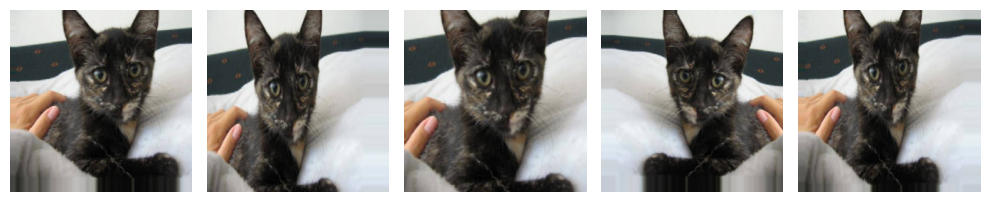

In [ ]:
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

* validation 데이터에도 같은 작업 수행, 평가할 용도로 사용할 거니 스케일만 변경

In [ ]:
image_gen_val = ImageDataGenerator(rescale=1./255)

In [ ]:
val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 1000 images belonging to 2 classes.


* validation 데이터 확인

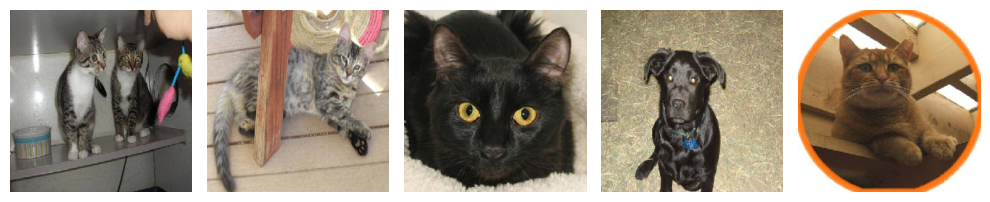

In [ ]:
sample_training_images, _ = next(val_data_gen)
plotImages(sample_training_images[:5])

In [ ]:
_[:5] # 정답 데이터 구성 확인

array([0., 0., 0., 1., 0.], dtype=float32)

* VGG 모델 구현하기

In [ ]:
input_layer = tf.keras.layers.Input(shape=(256, 256, 3)) # 가로, 세로, 채널 수(RGB)

x = tf.keras.layers.Conv2D(32, (3, 3), strides = 1, activation = 'relu', padding = 'same')(input_layer)
x = tf.keras.layers.Conv2D(32, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

x = tf.keras.layers.Conv2D(64, (3, 3), strides = 1, activation='relu', padding='same')(x)
x = tf.keras.layers.Conv2D(64, (3, 3), strides = 1, activation='relu', padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

x = tf.keras.layers.Conv2D(128, (3, 3), strides = 1, activation='relu', padding='same')(x)
x = tf.keras.layers.Conv2D(128, (3, 3), strides = 1, activation='relu', padding='same')(x)
x = tf.keras.layers.Conv2D(128, (3, 3), strides = 1, activation='relu', padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
out_layer = tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 256, 256, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 256, 256, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 256, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 128, 128, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 128, 128, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 64, 64, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 64, 64, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 131072)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1024)                │     134,218,752 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 512)                 │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 135,179,553 (515.67 MB)

 Trainable params: 135,179,105 (515.67 MB)

 Non-trainable params: 448 (1.75 KB)

* 손실함수, optimizer, metric 설정

In [ ]:
loss_function = tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.01) # 기본 설정은 0.001
metric = tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

* 모델 학습

In [ ]:
history = model.fit(
      train_data_gen,
      steps_per_epoch=int((len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir))) / batch_size), # 노션에서는 정상 작동했으나 오류 발생하여 int 사용
      epochs=epochs,
      validation_data=val_data_gen,
      validation_freq=1)

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


125/125 ━━━━━━━━━━━━━━━━━━━━ 77s 401ms/step - binary_accuracy: 0.4860 - loss: 119.2956 - val_binary_accuracy: 0.4390 - val_loss: 0.8424
Epoch 2/5


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


125/125 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - binary_accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_binary_accuracy: 0.4390 - val_loss: 0.8424
Epoch 3/5
125/125 ━━━━━━━━━━━━━━━━━━━━ 58s 377ms/step - binary_accuracy: 0.5170 - loss: 0.6952 - val_binary_accuracy: 0.5100 - val_loss: 0.6915
Epoch 4/5
125/125 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - binary_accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_binary_accuracy: 0.5100 - val_loss: 0.6915
Epoch 5/5
125/125 ━━━━━━━━━━━━━━━━━━━━ 76s 338ms/step - binary_accuracy: 0.4944 - loss: 0.6927 - val_binary_accuracy: 0.5020 - val_loss: 0.6960


* 시각화를 통해 정확도 확인

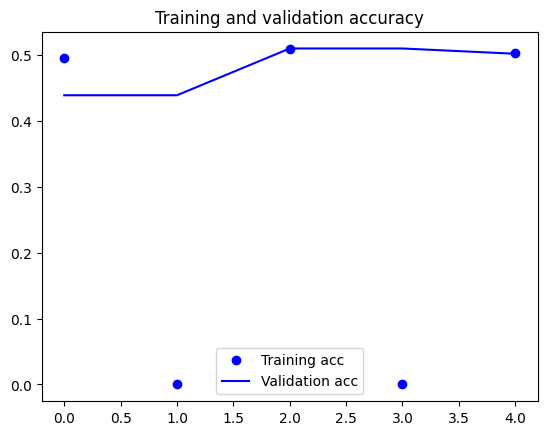

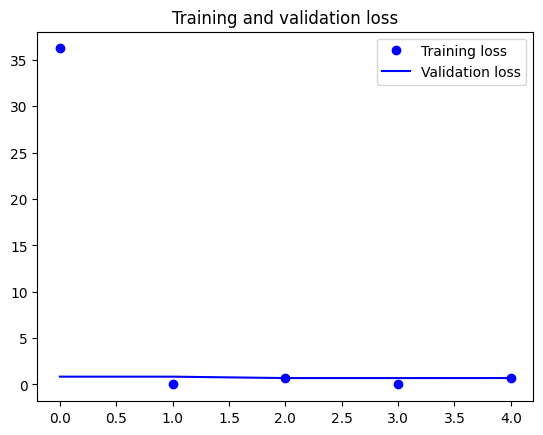

In [ ]:
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

* hyperparameter 변경을 통하여 모델 성능 올리기

In [ ]:
batch_size = 32 # 2배
epochs = 10 # 2배
IMG_HEIGHT = 256
IMG_WIDTH = 256

* generator 값 변경을 통하여 모델 성능 올리기

In [ ]:
image_gen2_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=40, # 40도까지 회전
                                     width_shift_range=0.2, #가로로 20% 이동
                                     height_shift_range=0.2, # 세로로 20% 이동
                                     zoom_range=0.2,
                                     shear_range=0.2,
                                     horizontal_flip=True,
                                     vertical_flip=False,
                                     fill_mode = 'nearest') # 빈 공간을 가까이 있는 픽셀 값으로 대체

In [ ]:
val_gen2_train = ImageDataGenerator(rescale=1./255) # 평가 용도로 사용, 스케일만 변경

모델 수정, skip connection을 사용하여 모델 성능 올리기

In [ ]:
input_layer = tf.keras.layers.Input(shape=(256, 256, 3))

x = tf.keras.layers.Conv2D(64, (3, 3), strides = 1, activation = 'relu', padding = 'same')(input_layer) # 크기 증가
x = tf.keras.layers.Conv2D(64, (3, 3), strides = 1, activation = 'relu', padding = 'same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

skip1 = x # skip connection 사용

x = tf.keras.layers.Conv2D(128, (3, 3), strides = 1, activation='relu', padding='same')(x)
x = tf.keras.layers.Conv2D(128, (3, 3), strides = 1, activation='relu', padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

skip2 = x # skip connection

x = tf.keras.layers.Conv2D(256, (3, 3), strides = 1, activation='relu', padding='same')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), strides = 1, activation='relu', padding='same')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), strides = 1, activation='relu', padding='same')(x) # 레이어 추가 생성
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

skip2 = tf.keras.layers.Conv2D(256, (1, 1), strides=2, padding='same')(skip2) # skip connection

x = tf.keras.layers.Add()([x, skip2]) # skip connection

x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
out_layer = tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])

model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_23 (Conv2D)        │ (None, 256, 256, 64)   │          1,792 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_24 (Conv2D)        │ (None, 256, 256, 64)   │         36,928 │ conv2d_23[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_9     │ (None, 256, 256, 64)   │            256 │ conv2d_24[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_9           │ (None, 128, 128, 64)   │              0 │ batch_normalization_9… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_25 (Conv2D)        │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d_9[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_26 (Conv2D)        │ (None, 128, 128, 128)  │        147,584 │ conv2d_25[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_10    │ (None, 128, 128, 128)  │            512 │ conv2d_26[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_10          │ (None, 64, 64, 128)    │              0 │ batch_normalization_1… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_27 (Conv2D)        │ (None, 64, 64, 256)    │        295,168 │ max_pooling2d_10[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_28 (Conv2D)        │ (None, 64, 64, 256)    │        590,080 │ conv2d_27[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_29 (Conv2D)        │ (None, 64, 64, 256)    │        590,080 │ conv2d_28[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_11    │ (None, 64, 64, 256)    │          1,024 │ conv2d_29[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_11          │ (None, 32, 32, 256)    │              0 │ batch_normalization_1… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_30 (Conv2D)        │ (None, 32, 32, 256)    │         33,024 │ max_pooling2d_10[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_2 (Add)               │ (None, 32, 32, 256)    │              0 │ max_pooling2d_11[0][0… │
│                      

 Total params: 270,732,097 (1.01 GB)

 Trainable params: 270,731,201 (1.01 GB)

 Non-trainable params: 896 (3.50 KB)

* optimizer 값을 수정하여 모델 성능 올리기

In [ ]:
optimize2=tf.keras.optimizers.Adam(learning_rate=0.001) # 0.001로 변경
model.compile(loss=loss_function,
              optimizer=optimize2,
              metrics=[metric])

* 모델 학습

In [ ]:
history = model.fit(
      train_data_gen,
      steps_per_epoch=int((len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir))) / batch_size),
      epochs=epochs,
      validation_data=val_data_gen,
      validation_freq=1)

Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 74s 687ms/step - binary_accuracy: 0.5167 - loss: 35.7554 - val_binary_accuracy: 0.5260 - val_loss: 1.6474
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 28s 449ms/step - binary_accuracy: 0.5406 - loss: 2.2227 - val_binary_accuracy: 0.5360 - val_loss: 2.7258
Epoch 3/10
 1/62 ━━━━━━━━━━━━━━━━━━━━ 16s 263ms/step - binary_accuracy: 0.6250 - loss: 1.3455

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - binary_accuracy: 0.6250 - loss: 1.3455 - val_binary_accuracy: 0.5370 - val_loss: 2.6788
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 31s 468ms/step - binary_accuracy: 0.5792 - loss: 0.8826 - val_binary_accuracy: 0.5460 - val_loss: 0.8856
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 28s 455ms/step - binary_accuracy: 0.5884 - loss: 0.8045 - val_binary_accuracy: 0.5480 - val_loss: 0.8950
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - binary_accuracy: 0.3750 - loss: 0.7676 - val_binary_accuracy: 0.5410 - val_loss: 0.8865
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 31s 462ms/step - binary_accuracy: 0.6162 - loss: 0.6742 - val_binary_accuracy: 0.5830 - val_loss: 0.8148
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 28s 450ms/step - binary_accuracy: 0.6279 - loss: 0.6804 - val_binary_accuracy: 0.6020 - val_loss: 0.7333
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - binary_accuracy: 0.6875 - loss: 0.4884 - val_binary_accuracy: 0.5940 - val_loss: 0.7446
Epoch 10/10
62/6

* 시각화로 성능 확인

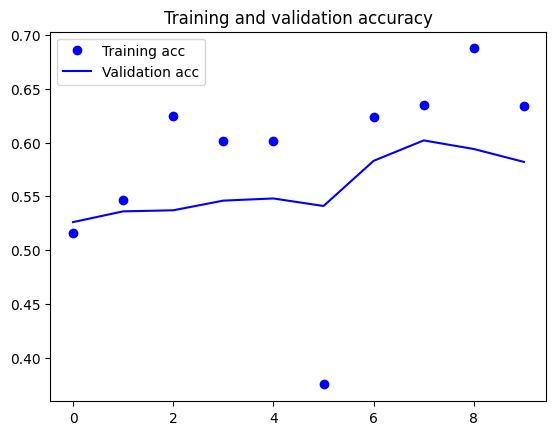

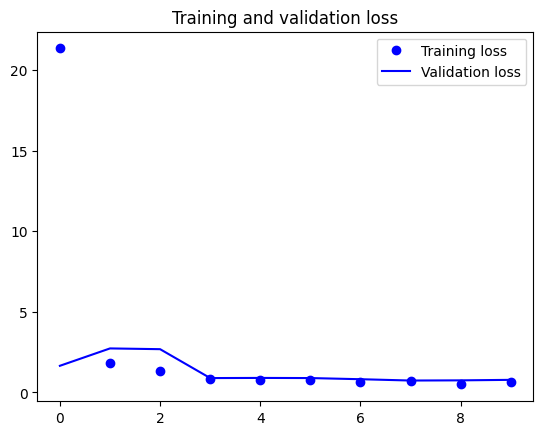

In [ ]:
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

* hyperparameter 값 증가, generator 값 조정, optimizer 설정과 모델 수정이 실제로 모델의 정확도를<br> 개선하는 것을 시각화를 통하여 직관적으로 확인할 수 있었습니다. <br>노션에서는 잘 작동되는 부분이 틀어지거나 오류가 발생하여 이해가 어려운 부분이 많았습니다.

#프로젝트 2 : Object Detection#

* 필요한 라이브러리 호출

In [ ]:
!pip3 install tensorflow-estimator==2.6.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.9/462.9 kB 24.2 MB/s eta 0:00:00


In [11]:
import tensorflow as tf
import tensorflow_hub as hub


import matplotlib.pyplot as plt # 이미지를 다운로드할 때 사용하는 모듈들
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

import numpy as np # 이미지에 선과 폰트를 넣을 때 사용하는 모듈들
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

import time # Detection에 소요된 시간을 점검하기 위한 모듈

* 이미지를 시각화하는 함수 생성

In [12]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

* 원하는 이미지를 다운로드하고 정해진 가로, 세로 키기에 맞게 리사이징하는 함수

In [13]:
def download_and_resize_image(url, new_width=256, new_height=256, display=False):

  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 읽기
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.LANCZOS) # 이미지 조정
  pil_image_rgb = pil_image.convert("RGB") # RGB로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

* Bounding Box를 만드는 함수

In [14]:
def draw_bounding_box_on_image(image,
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):

  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

  # Bounding box 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getbbox(ds)[3] - font.getbbox(ds)[1] for ds in display_str_list]

  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height

  for display_str in display_str_list[::-1]:
    bbox = font.getbbox(display_str)  # getbbox가 반환하는 4개의 좌표값을 변수에 저장
    text_width = bbox[2] - bbox[0]   # Bounding box의 너비 (xmax - xmin)
    text_height = bbox[3] - bbox[1]  # Bounding box의 높이 (ymax - ymin)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

* 이미지 위에 class 이름과 score를 나타내는 함수

In [15]:
# Bounding box 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# Bounding box 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # box의 좌표 값
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

* 이미지 불러오기

Image downloaded to /tmp/tmph5r_fqom.jpg.


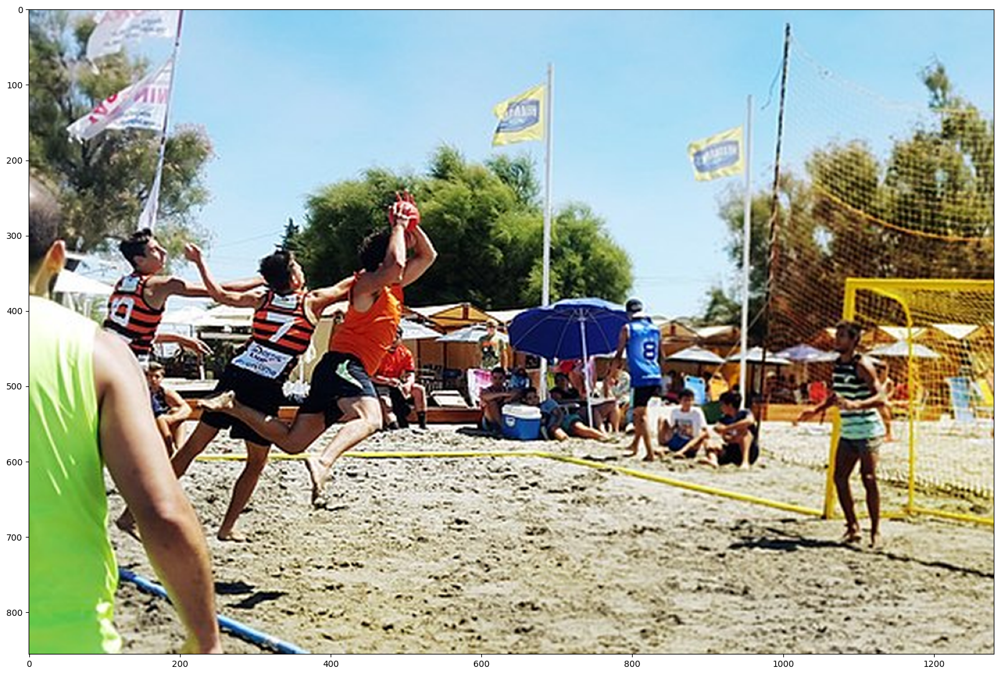

In [25]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

* 사전 학습된 InceptionResnet 모델을 사용한 RCNN 모델 불러오기

In [23]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

In [16]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

* Detector를 실행하는 함수 생성

In [21]:
def run_detector(detector, path):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요 시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)



* detector 실행

Found 100 objects.
Inference time:  80.48168230056763


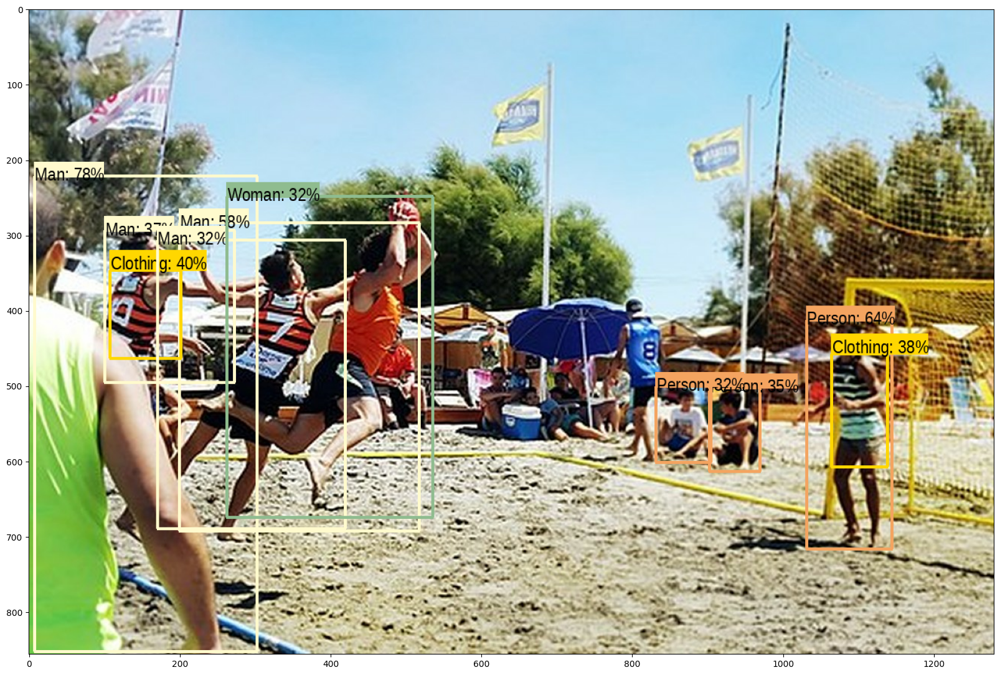

In [26]:
run_detector(detector, downloaded_image_path)

* 다른 이미지로 테스트

Image downloaded to /tmp/tmp7w28axgd.jpg.


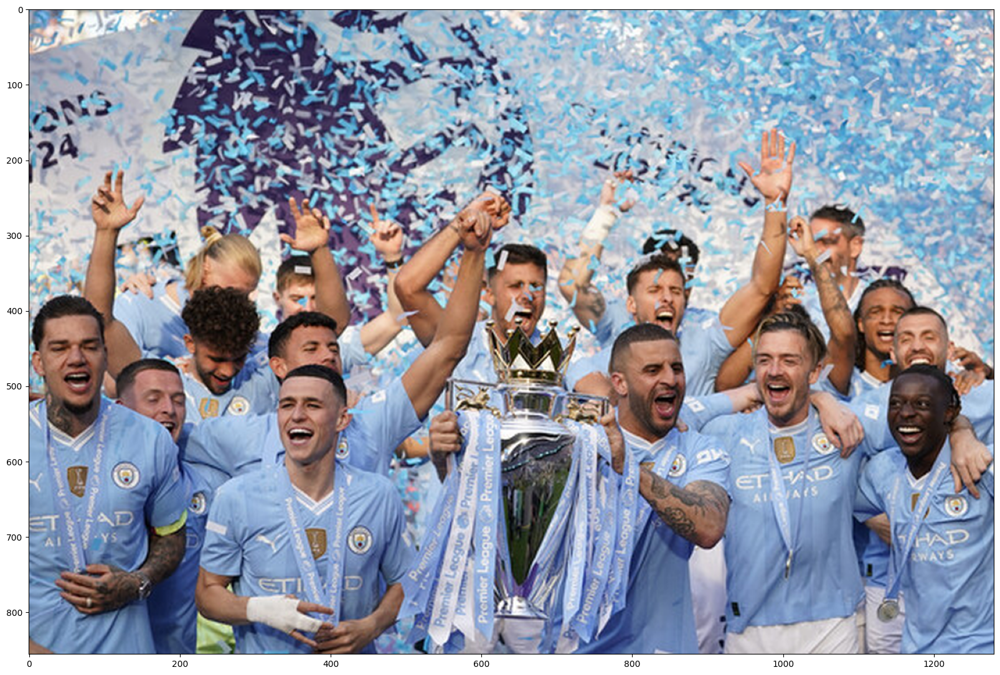

In [18]:
image_url  = "https://www.wolyo.co.kr/news/photo/202405/240460_129412_108.jpg"
downloaded_image_pathk = download_and_resize_image(image_url, 1280, 856, True)

Found 100 objects.
Inference time:  38.72871398925781


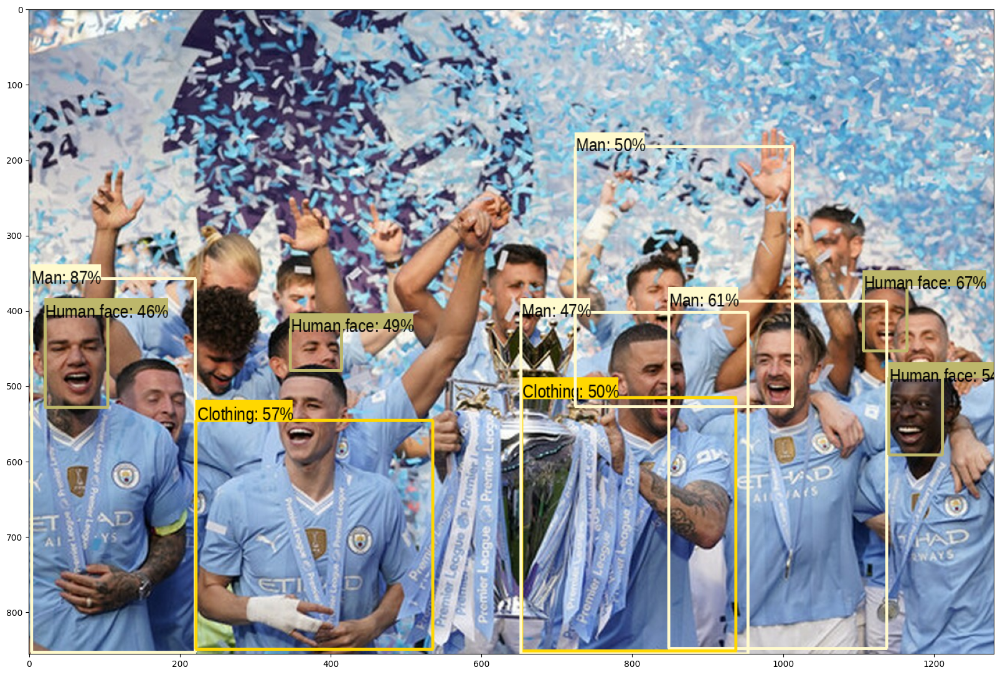

In [28]:
run_detector(detector, downloaded_image_pathk)

* Object Detection을 할 수 있는 다른 모델인 YOLO 테스트 후 비교

In [29]:
import torch
yolos = torch.hub.load('ultralytics/yolov5', 'yolov5s') # YOLOv5s 사용
def run_yolo_detector(path):
    results = yolos(path)
    results.show()
    print(results.pandas().xyxy[0])

/usr/local/lib/python3.10/dist-packages/torch/hub.py:295: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
requirements: Ultralytics requirement ['gitpython>=3.1.30'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 139.6 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 3.6s, installed 1 package: ['gitpython>=3.1.30']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



YOLOv5 🚀 2024-9-27 Python-3.10.12 torch-2.4.1+cu121 CPU

100%|██████████| 14.1M/14.1M [00:00<00:00, 212MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


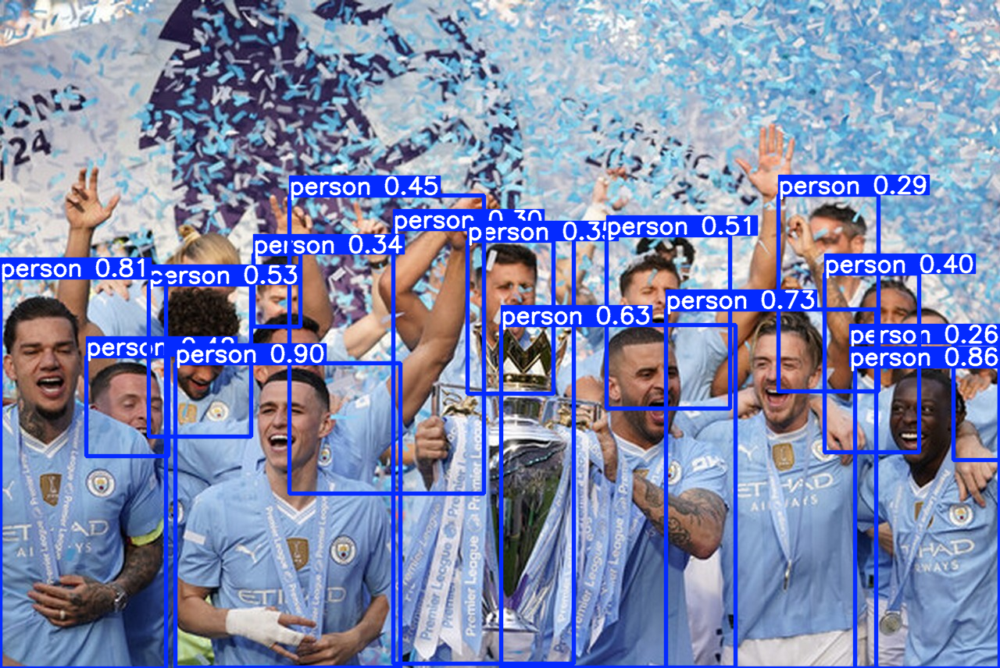

           xmin        ymin         xmax        ymax  confidence  class  \
0    224.397064  465.584351   512.762939  855.733276    0.901687      0   
1   1094.876709  469.352844  1279.112061  856.000000    0.862934      0   
2      0.039017  355.727356   212.474289  856.000000    0.809288      0   
3    852.582214  396.230774  1121.843018  856.000000    0.726913      0   
4    641.466858  416.778229   941.291077  855.095459    0.634932      0   
5    190.007278  364.353729   321.960815  559.195190    0.525420      0   
6    776.276550  301.965393   934.836487  523.004395    0.510552      0   
7    370.764771  250.600769   619.033447  632.302429    0.454777      0   
8    110.333000  456.379608   215.634399  584.810181    0.415360      0   
9   1055.522095  350.844482  1176.939331  579.686279    0.404735      0   
10   598.708252  308.260864   708.867432  504.159912    0.351858      0   
11   324.042999  325.844971   384.954071  418.115112    0.335468      0   
12   503.251251  293.2106

In [31]:
run_yolo_detector(downloaded_image_pathk)

* 1번째 모델인 Inception ResNet을 활용한 Faster RCNN은 포착 빈도는 낮아도 사람과 얼굴, 옷까지 잡아내는 등
<br>세부적인데 비교로 사용한 YOLO5s은 포착은 잘하지만 사람만 탐지하여 세부적인 탐지 능력은 YOLO5s 쪽이<br> 더 떨어지는 것으로 생각됩니다.